In [1]:
import odc.stac
import adlfs
import xarray as xr
import pathlib
import tqdm
import folium 
import shapely
import geopandas as gpd
import pandas as pd
import rioxarray as rxr
import configparser

In [2]:
import dask.distributed

client = dask.distributed.Client()
client

# import coiled
# cluster = coiled.Cluster(name="which_tiles_to_process",
#                          idle_timeout="10 minutes",
#                          n_workers=10,
#                          worker_memory="8 GiB",
#                          spot_policy="spot", # spot usually
#                          #software="sar_snowmelt_timing",
#                          environ={"GDAL_DISABLE_READDIR_ON_OPEN": "EMPTY_DIR"},
#                          #container="mcr.microsoft.com/planetary-computer/python:latest",
#                          workspace="azure",

#                          )

# client = cluster.get_client()

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 16,Total memory: 15.48 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41017,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 16
Started: Just now,Total memory: 15.48 GiB
Comm: tcp://127.0.0.1:45045,Total threads: 4
Dashboard: http://127.0.0.1:34679/status,Memory: 3.87 GiB
Nanny: tcp://127.0.0.1:35977,


In [3]:

# config['VALUES'] = {'resolution': 0.00072000072000072,
#                     'chunk_size': 2048,
#                     'bbox_left': -179.999,
#                     'bbox_right': 179.999,
#                     'bbox_top': 84.999,
#                     'bbox_bottom': -59.999,}

# with open('global_config.txt', 'w') as configfile:
#   config.write(configfile)

config = configparser.ConfigParser()

config.read('global_config.txt')
resolution = config.getfloat('VALUES', 'resolution')
chunk_size = (config.getint('VALUES', 'chunk_size'),config.getint('VALUES', 'chunk_size'))
bbox_left = config.getfloat('VALUES', 'bbox_left')
bbox_right = config.getfloat('VALUES', 'bbox_right')
bbox_top = config.getfloat('VALUES', 'bbox_top')
bbox_bottom = config.getfloat('VALUES', 'bbox_bottom')

print(f'Config loaded: \n{resolution=}, \n{chunk_size=}, \n{bbox_left=}, \n{bbox_right=}, \n{bbox_top=}, \n{bbox_bottom=}')

Config loaded: 
resolution=0.00072000072000072, 
chunk_size=(2048, 2048), 
bbox_left=-179.999, 
bbox_right=179.999, 
bbox_top=81.099, 
bbox_bottom=-59.999


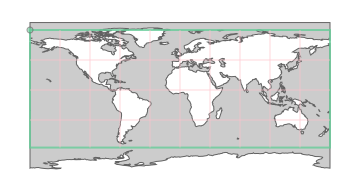

In [4]:
global_geobox = odc.geo.geobox.GeoBox.from_bbox((bbox_left, bbox_bottom,
   bbox_right, bbox_top),crs="epsg:4326", resolution=resolution)
global_geobox

In [5]:
global_geobox.boundingbox

BoundingBox(left=-179.99945999946, bottom=-59.9990999991, right=179.99945999946, top=81.0994410994411, crs=CRS('EPSG:4326'))

In [6]:
geobox_tiles = odc.geo.geobox.GeoboxTiles(global_geobox,chunk_size)
geobox_tiles

Tiles: 96x245|2048x2048px => 195_970x499_998px

In [7]:
geometries = [shapely.geometry.Polygon(geobox_tiles[idx].extent.boundary.coords) for idx in geobox_tiles._all_tiles()]
indices = [idx for idx in geobox_tiles._all_tiles()]

multi_index = pd.MultiIndex.from_tuples(indices, names=['row', 'col'])

# Create a GeoDataFrame
tiles_gdf = gpd.GeoDataFrame({'tile':indices,'geometry': geometries}, index=multi_index, crs=geobox_tiles[0,0].crs)
#gdf.set_index('index', inplace=True)
tiles_gdf['percent_valid_snow_pixels'] = 0.0
tiles_gdf

tile                                           geometry  \
row col                                                                 
0   0       (0, 0)  POLYGON ((-179.99946 81.09944, -179.99946 79.6...   
    1       (0, 1)  POLYGON ((-178.5249 81.09944, -178.5249 79.624...   
    2       (0, 2)  POLYGON ((-177.05034 81.09944, -177.05034 79.6...   
    3       (0, 3)  POLYGON ((-175.57578 81.09944, -175.57578 79.6...   
    4       (0, 4)  POLYGON ((-174.10121 81.09944, -174.10121 79.6...   
...            ...                                                ...   
95  240  (95, 240)  POLYGON ((173.89529 -58.9839, 173.89529 -59.99...   
    241  (95, 241)  POLYGON ((175.36986 -58.9839, 175.36986 -59.99...   
    242  (95, 242)  POLYGON ((176.84442 -58.9839, 176.84442 -59.99...   
    243  (95, 243)  POLYGON ((178.31898 -58.9839, 178.31898 -59.99...   
    244  (95, 244)  POLYGON ((179.79354 -58.9839, 179.79354 -59.99...   

         percent_valid_snow_pixels  
row col                             
0   0                          0.0  
    1                          0.0  
    2                          0.0  
    3                          0.0  
    4                          0.0  
...                            ...  
95  240                        0.0  
    241                        0.0  
    242                        0.0  
    243                        0.0  
    244                        0.0  

[23520 rows x 3 columns]

In [8]:
tiles_gdf.explore()

In [9]:
# sas_token = pathlib.Path('sas_token.txt').read_text()
# store = adlfs.AzureBlobFileSystem(account_name="snowmelt", credential=sas_token).get_mapper("snowmelt/snow_mask/global_modis_snow_mask.zarr")
# seasonal_snow_mask = xr.open_zarr(store, consolidated=True, decode_coords='all')
# max_snow_extent = xr.where(seasonal_snow_mask['max_consec_snow_days'].max(dim='water_year')>=56,1,0).astype(bool)
# max_snow_extent
#max_snow_extent.rio.to_raster('max_seasonal_snow_extent_WY2015_2023.tif',engine='COG',dtype='uint8',tiled=True,windowed=False)


In [10]:
max_snow_extent = rxr.open_rasterio('max_seasonal_snow_extent_WY2015_WY2023_4326.tif',mask_and_scale=True).squeeze() # made using previous cell, reprojected using QGIS
max_snow_extent

<xarray.DataArray (y: 58227, x: 116453)> Size: 27GB
[6780708831 values with dtype=float32]
Coordinates:
    band         int64 8B 1
  * x            (x) float64 932kB -180.0 -180.0 -180.0 ... 180.0 180.0 180.0
  * y            (y) float64 466kB 90.0 90.0 89.99 89.99 ... -89.99 -89.99 -90.0
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    long_name:      max_consec_snow_days

In [11]:
# m = folium.Map(location=[extent[1], extent[0]], zoom_start=10)

# max_snow_extent.sel({'y':slice(5400000,4000000),'x':slice(-9300000,-8500000)}).odc.explore(map=m)

# test_tile.explore(map=m)

In [12]:
# bbox = test_tile.boundingbox
# extent = bbox.left, bbox.bottom, bbox.right, bbox.top
# extent

# max_snow_extent_clipped = max_snow_extent.rio.clip_box(*extent, crs=test_tile.crs)
# max_snow_extent_clipped

# max_snow_extent_clipped.plot.imshow()

# max_snow_extent_clipped.odc.reproject(test_tile).plot.imshow()

In [13]:
# azure_file = adlfs.AzureBlobFileSystem(account_name="snowmelt", credential=sas_token).get_mapper("snowmelt/snow_mask/valid_pixels.json")
# gdf.to_file(azure_file, driver='GeoJSON')

In [14]:
url = (
    f"https://data.earthenv.org/mountains/standard/GMBA_Inventory_v2.0_standard_300.zip"
)
gmba_gdf = gpd.read_file("zip+" + url)

gmba_gdf['geometry'] = gmba_gdf['geometry'].simplify(0.05)

mask = tiles_gdf.geometry.apply(lambda x: gmba_gdf.geometry.intersects(x).any())
filtered_tiles_gdf = tiles_gdf[mask]
filtered_tiles_gdf

tile                                           geometry  \
row col                                                                
0   56    (0, 56)  POLYGON ((-97.42402 81.09944, -97.42402 79.624...   
    57    (0, 57)  POLYGON ((-95.94946 81.09944, -95.94946 79.624...   
    58    (0, 58)  POLYGON ((-94.47489 81.09944, -94.47489 79.624...   
    59    (0, 59)  POLYGON ((-93.00033 81.09944, -93.00033 79.624...   
    60    (0, 60)  POLYGON ((-91.52577 81.09944, -91.52577 79.624...   
...           ...                                                ...   
92  75   (92, 75)  POLYGON ((-69.40735 -54.56021, -69.40735 -56.0...   
    76   (92, 76)  POLYGON ((-67.93279 -54.56021, -67.93279 -56.0...   
    77   (92, 77)  POLYGON ((-66.45823 -54.56021, -66.45823 -56.0...   
    78   (92, 78)  POLYGON ((-64.98366 -54.56021, -64.98366 -56.0...   
    97   (92, 97)  POLYGON ((-36.967 -54.56021, -36.967 -56.03478...   

         percent_valid_snow_pixels  
row col                             
0   56                         0.0  
    57                         0.0  
    58                         0.0  
    59                         0.0  
    60                         0.0  
...                            ...  
92  75                         0.0  
    76                         0.0  
    77                         0.0  
    78                         0.0  
    97                         0.0  

[4732 rows x 3 columns]

In [15]:
world_gdf = gpd.read_file(f"zip+https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip")

canada_gdf = world_gdf[world_gdf['NAME']=='Canada']
canada_islands_geometries =  canada_gdf['geometry'].iloc[0] - canada_gdf['geometry'].iloc[0].geoms[0] - canada_gdf['geometry'].iloc[0].geoms[10] - canada_gdf['geometry'].iloc[0].geoms[15] - canada_gdf['geometry'].iloc[0].geoms[17]

greenland_gdf = world_gdf[world_gdf['NAME']=='Greenland']
greenland_gdf['geometry'] = greenland_gdf.to_crs('EPSG:32624').buffer(60000).to_crs(world_gdf.crs)

filtered_tiles_gdf = filtered_tiles_gdf[(~filtered_tiles_gdf.intersects(greenland_gdf.union_all())) & (~filtered_tiles_gdf.intersects(canada_islands_geometries))] #exclude greenland and canadian islands
filtered_tiles_gdf

/home/eric/miniconda3/envs/sar_snowmelt_timing/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


tile                                           geometry  \
row col                                                                
0   129  (0, 129)  POLYGON ((10.21897 81.09944, 10.21897 79.62488...   
    130  (0, 130)  POLYGON ((11.69353 81.09944, 11.69353 79.62488...   
    131  (0, 131)  POLYGON ((13.16809 81.09944, 13.16809 79.62488...   
    132  (0, 132)  POLYGON ((14.64265 81.09944, 14.64265 79.62488...   
    133  (0, 133)  POLYGON ((16.11722 81.09944, 16.11722 79.62488...   
...           ...                                                ...   
92  75   (92, 75)  POLYGON ((-69.40735 -54.56021, -69.40735 -56.0...   
    76   (92, 76)  POLYGON ((-67.93279 -54.56021, -67.93279 -56.0...   
    77   (92, 77)  POLYGON ((-66.45823 -54.56021, -66.45823 -56.0...   
    78   (92, 78)  POLYGON ((-64.98366 -54.56021, -64.98366 -56.0...   
    97   (92, 97)  POLYGON ((-36.967 -54.56021, -36.967 -56.03478...   

         percent_valid_snow_pixels  
row col                             
0   129                        0.0  
    130                        0.0  
    131                        0.0  
    132                        0.0  
    133                        0.0  
...                            ...  
92  75                         0.0  
    76                         0.0  
    77                         0.0  
    78                         0.0  
    97                         0.0  

[4445 rows x 3 columns]

In [20]:
tile_indicies = filtered_tiles_gdf.reset_index().tile.values

for idx in tqdm.tqdm(tile_indicies, total=len(list(tile_indicies))):
    tile = geobox_tiles[idx]
    bbox = tile.boundingbox
    bbox_geometry = shapely.geometry.box(bbox.left, bbox.bottom, bbox.right, bbox.top)

    bbox_gdf = gpd.GeoDataFrame(geometry=[bbox_geometry], crs=gmba_gdf.crs)
    gmba_clipped = gpd.clip(gmba_gdf, bbox_gdf)
    max_snow_extent_clipped = max_snow_extent.sel(x=slice(bbox.left,bbox.right),y=slice(bbox.top,bbox.bottom))
    #num_snow_pixels = max_snow_extent_clipped.sum().values for non mountain
    try:
        num_snow_pixels = max_snow_extent_clipped.rio.clip(gmba_clipped.geometry).sum().values
    except:
        num_snow_pixels = 0
        
    count_total_pixels = max_snow_extent_clipped.count().values
    filtered_tiles_gdf.loc[(idx[0],idx[1]),'percent_valid_snow_pixels'] = num_snow_pixels/count_total_pixels
        #gdf.loc[(idx[0],idx[1]),'percent_valid_snow_pixels'] = -1

100%|██████████| 4445/4445 [02:01<00:00, 36.47it/s]


In [21]:
filtered_tiles_gdf

tile                                           geometry  \
row col                                                                
0   129  (0, 129)  POLYGON ((10.21897 81.09944, 10.21897 79.62488...   
    130  (0, 130)  POLYGON ((11.69353 81.09944, 11.69353 79.62488...   
    131  (0, 131)  POLYGON ((13.16809 81.09944, 13.16809 79.62488...   
    132  (0, 132)  POLYGON ((14.64265 81.09944, 14.64265 79.62488...   
    133  (0, 133)  POLYGON ((16.11722 81.09944, 16.11722 79.62488...   
...           ...                                                ...   
92  75   (92, 75)  POLYGON ((-69.40735 -54.56021, -69.40735 -56.0...   
    76   (92, 76)  POLYGON ((-67.93279 -54.56021, -67.93279 -56.0...   
    77   (92, 77)  POLYGON ((-66.45823 -54.56021, -66.45823 -56.0...   
    78   (92, 78)  POLYGON ((-64.98366 -54.56021, -64.98366 -56.0...   
    97   (92, 97)  POLYGON ((-36.967 -54.56021, -36.967 -56.03478...   

         percent_valid_snow_pixels  
row col                             
0   129                   0.027702  
    130                   0.074144  
    131                   0.020819  
    132                   0.034677  
    133                   0.012359  
...                            ...  
92  75                    0.425889  
    76                    0.245402  
    77                    0.037727  
    78                    0.024814  
    97                    0.000000  

[4445 rows x 3 columns]

In [22]:
filtered_tiles_gdf.explore(column='percent_valid_snow_pixels')

In [23]:
valid_tiles_gdf = filtered_tiles_gdf[filtered_tiles_gdf['percent_valid_snow_pixels']>0.001] #exclude greenland, canada islands, and must have at least 0.1% valid snow pixels, and must be at least row 5
# check VV/VH polarization scehma: https://sentinels.copernicus.eu/documents/247904/4834610/Sentinel-1-Mode-Polarisation-Geometry-2022.png

In [24]:
valid_tiles_gdf

tile                                           geometry  \
row col                                                                
0   129  (0, 129)  POLYGON ((10.21897 81.09944, 10.21897 79.62488...   
    130  (0, 130)  POLYGON ((11.69353 81.09944, 11.69353 79.62488...   
    131  (0, 131)  POLYGON ((13.16809 81.09944, 13.16809 79.62488...   
    132  (0, 132)  POLYGON ((14.64265 81.09944, 14.64265 79.62488...   
    133  (0, 133)  POLYGON ((16.11722 81.09944, 16.11722 79.62488...   
...           ...                                                ...   
92  74   (92, 74)  POLYGON ((-70.88191 -54.56021, -70.88191 -56.0...   
    75   (92, 75)  POLYGON ((-69.40735 -54.56021, -69.40735 -56.0...   
    76   (92, 76)  POLYGON ((-67.93279 -54.56021, -67.93279 -56.0...   
    77   (92, 77)  POLYGON ((-66.45823 -54.56021, -66.45823 -56.0...   
    78   (92, 78)  POLYGON ((-64.98366 -54.56021, -64.98366 -56.0...   

         percent_valid_snow_pixels  
row col                             
0   129                   0.027702  
    130                   0.074144  
    131                   0.020819  
    132                   0.034677  
    133                   0.012359  
...                            ...  
92  74                    0.337065  
    75                    0.425889  
    76                    0.245402  
    77                    0.037727  
    78                    0.024814  

[2557 rows x 3 columns]

In [25]:
valid_tiles_gdf.explore(column='percent_valid_snow_pixels')

In [26]:
valid_tiles_gdf.to_file('valid_tiles.geojson', driver='GeoJSON')